This notebook contains our experiments on selecting a text model for prompt generation. The model should accept the Russian name of a holiday and generate English prompts that will be fed to the image generation model.

In [ ]:
!pip install -q transformers accelerate torch

## pai-bloom-1b1-text2prompt-sd-v2
We use hardcoded holiday descriptions and accept holiday names as input

In [ ]:
# hardcode with keys and without translator but not bad promts

import torch
from transformers import AutoTokenizer, AutoModelForCausalLM

device = "cuda" if torch.cuda.is_available() else "cpu"

bp_tok = AutoTokenizer.from_pretrained("alibaba-pai/pai-bloom-1b1-text2prompt-sd-v2")
bp = AutoModelForCausalLM.from_pretrained(
    "alibaba-pai/pai-bloom-1b1-text2prompt-sd-v2"
).to(device).eval()

BP_TEMPLATE = (
    "Converts a simple image description into a prompt. "
    "Prompts are formatted as multiple related tags separated by commas, "
    "you can use () to increase weight and [] to decrease weight. "
    "Add appropriate words to make the image more aesthetically pleasing, "
    "but keep correlated with the input.\n"
    "### Input: {raw_prompt}\n### Output:"
)

@torch.inference_mode()
def enhance_with_beautifulprompt(text_en: str, max_new_tokens=196) -> str:
    ids = bp_tok.encode(BP_TEMPLATE.format(raw_prompt=text_en), return_tensors="pt").to(device)
    out = bp.generate(
        ids,
        max_new_tokens=max_new_tokens,
        do_sample=True, temperature=0.9, top_k=50, top_p=0.95,
        repetition_penalty=1.1, num_return_sequences=1
    )
    return bp_tok.batch_decode(out[:, ids.size(1):], skip_special_tokens=True)[0].strip()

from transformers import AutoModelForCausalLM as CausalLM, AutoTokenizer as AutoTok

promptist = CausalLM.from_pretrained("microsoft/Promptist").to(device).eval()
ptok = AutoTok.from_pretrained("gpt2")
ptok.pad_token = ptok.eos_token
ptok.padding_side = "left"

@torch.inference_mode()
def enhance_with_promptist(text_en: str, beams=8, max_new_tokens=75) -> str:
    prefix = text_en.strip() + " Rephrase:"
    inp = ptok(prefix, return_tensors="pt").to(device)
    out = promptist.generate(
        **inp, do_sample=False, num_beams=beams, num_return_sequences=1,
        max_new_tokens=max_new_tokens, eos_token_id=ptok.eos_token_id,
        pad_token_id=ptok.eos_token_id, length_penalty=-1.0
    )
    txt = ptok.decode(out[0], skip_special_tokens=True)
    return txt.replace(prefix, "").strip()

HOLIDAY_SEEDS = {
    # RU keys
    "8 марта": "International Women's Day postcard with pink roses, hearts, satin ribbon, pastel gradient, glitter sparkles, no text",
    "женский день": "International Women's Day postcard with pink roses, hearts, satin ribbon, pastel gradient, glitter sparkles, no text",
    "день святого валентина": "Valentine's Day postcard with big pink heart, red roses, lace border, cute plush bear, glitter sparkles, no text",
    "валентин": "Valentine's Day postcard with big pink heart, red roses, lace border, cute plush bear, glitter sparkles, no text",
    "пасха": "Easter postcard scene with basket of decorated eggs, white lilies, willow branches, pastel pink and green, glitter sparkles, no text",
    "новый год": "New Year greeting postcard with snowy fir branches, golden ornaments, fireworks bokeh, red ribbon bow, glitter sparkles, no text",
    "рождество": "Christmas postcard with red poinsettias, pine cones, golden bells, warm candlelight, snowflakes bokeh, glitter sparkles, no text",
    "день рождения": "Birthday postcard with cake, strawberries, candles, balloons, confetti, pastel gradient background, glitter sparkles, no text",
    "1 сентября": "Back to school postcard with bouquet of asters, school bell, lined paper texture, golden ribbon, warm bokeh, no text",

    # EN keys
    "international women's day": "International Women's Day postcard with pink roses, hearts, satin ribbon, pastel gradient, glitter sparkles, no text",
    "valentine's day": "Valentine's Day postcard with big pink heart, red roses, lace border, cute plush bear, glitter sparkles, no text",
    "easter": "Easter postcard scene with basket of decorated eggs, white lilies, willow branches, pastel pink and green, glitter sparkles, no text",
    "new year": "New Year greeting postcard with snowy fir branches, golden ornaments, fireworks bokeh, red ribbon bow, glitter sparkles, no text",
    "christmas": "Christmas postcard with red poinsettias, pine cones, golden bells, warm candlelight, snowflakes bokeh, glitter sparkles, no text",
    "birthday": "Birthday postcard with cake, strawberries, candles, balloons, confetti, pastel gradient background, glitter sparkles, no text",
    "back to school": "Back to school postcard with bouquet of asters, school bell, lined paper texture, golden ribbon, warm bokeh, no text",
}

def pick_seed(user_text: str) -> str:
    key = user_text.strip().lower()
    if key in ("8 марта", "8е марта", "восьмое марта"):
        key = "8 марта"
    return HOLIDAY_SEEDS.get(key, f"postcard for {user_text} with fitting symbols, flowers, ribbon, pastel gradient, glitter sparkles, no text")

def holiday_to_prompt(user_text: str, engine="beautiful") -> str:
    base = pick_seed(user_text)
    if engine == "beautiful":
        try:
            return enhance_with_beautifulprompt(base)
        except Exception:
            return enhance_with_promptist(base)
    else:
        p = enhance_with_promptist(base)
        return p if p.lower() != base.lower() else enhance_with_beautifulprompt(base)

tests = ["March 8", "New Year", "Easter", "Valentine's Day", "Birthday"]
for t in tests:
    out = holiday_to_prompt(t, engine="beautiful")
    print(f"\n[{t}] →\n{out}\n")



[March 8] →
(best quality), (masterpiece:1.2), absurdres, (realistic:1.5), postcard of (March 8:8), no humans, fitting symbols, flowers, ribbon, pastel gradient, glitter sparkles, pink bowtie, green sweater, white skirt, grey jacket, flat chest, long hair


[New Year] →
(masterpiece:1.2), (best quality:1.2), New Year greetings, snowing branch, fir trees, golden branches, elegant, high detail, extremely detailed, furious golden branches, snowflakes, golden chains, (high detailed fur:1.2), snowflakes, (glitter:1.3), fireworks, bokeh, glow, red ribbon bow, bowtie, gloves, (no text:1.2)


[Easter] →
(masterpiece), best quality, ultra-detailed, original, beautiful, extremely detailed wallpaper, (Easter Post Card Scene:1.5), Basket of decorated eggs, white lilies, willow branches, pastel pink and green, Glitter sparkles, No text, Wallpaper in high resolution, tft Laptop or desktop


[Valentine's Day] →
(best quality:1.2), (masterpiece:1.3), Post Card, (big pink heart:1.5), (red roses:1.4), 

In [ ]:
enhanced = holiday_to_prompt("8 марта")
print(enhanced)


Postcard of international women day, pink roses on black cardboard tube, gold butterfly in frame, white background, heart-shaped letters to the top, satin ribbon, pastel gradient, glitter sparkles, embellished with a few roses, very detailed, lovely, minneapolis


A translator was added. Prompt turned out to be quite weak compared to other experiments.

In [ ]:
import re, torch
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, AutoModelForCausalLM

device = "cuda" if torch.cuda.is_available() else "cpu"

ruen_tok = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-ru-en")
ruen_mt  = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-ru-en").to(device).eval()

@torch.inference_mode()
def ru2en(text: str) -> str:
    enc = ruen_tok(text, return_tensors="pt").to(device)
    out = ruen_mt.generate(**enc, max_new_tokens=96)
    return ruen_tok.batch_decode(out, skip_special_tokens=True)[0].strip()

bp_tok = AutoTokenizer.from_pretrained("alibaba-pai/pai-bloom-1b1-text2prompt-sd-v2")
bp_llm = AutoModelForCausalLM.from_pretrained("alibaba-pai/pai-bloom-1b1-text2prompt-sd-v2").to(device).eval()

SAFE_TEMPLATE = (
    "Rewrite the short holiday description into a Stable Diffusion prompt for a festive POSTCARD.\n"
    "Rules:\n"
    "- Focus on holiday symbols, flowers, hearts, ribbons, candles, fireworks, snow, eggs, lilies, willow, etc.\n"
    "- Keep it cheerful, high saturation, pastel gradients, glitter sparkles.\n"
    "- Must include: 'postcard', 'no text'.\n"
    "- FORBIDDEN: artist names, camera brands, NSFW, body/anatomy terms, 'masterpiece', '8k', 'absurdres', 'by ...'.\n"
    "- Output: comma-separated short tags, <= 60 words.\n"
    "### Input: {raw}\n### Output:"
)

@torch.inference_mode()
def enhance_safe(en_text: str, max_new_tokens=120) -> str:
    prompt = SAFE_TEMPLATE.format(raw=en_text.strip())
    ids = bp_tok.encode(prompt, return_tensors="pt").to(device)
    out = bp_llm.generate(
        ids, max_new_tokens=max_new_tokens,
        do_sample=True, temperature=0.4, top_p=0.85, top_k=50,
        repetition_penalty=1.1, num_return_sequences=1
    )
    return bp_tok.batch_decode(out[:, ids.size(1):], skip_special_tokens=True)[0].strip()

BLACKLIST = [
    r"\bmasterpiece\b", r"\bbest quality\b", r"\b8k\b", r"\babsurdres\b",
    r"\b(anatomy|nsfw|nude)\b", r"\b(by|art by)\s+[A-Z][a-z]+",
    r"\bdslr\b", r"\bradiosity\b", r"\bphoton mapping\b"
]
def sanitize(txt: str, max_words=60) -> str:
    t = txt
    for patt in BLACKLIST:
        t = re.sub(patt, "", t, flags=re.IGNORECASE)
    t = re.sub(r"\s*,\s*", ", ", t)
    t = re.sub(r"(,\s*){2,}", ", ", t).strip(" ,")
    words = t.split()
    if len(words) > max_words:
        t = " ".join(words[:max_words])
    low = t.lower()
    if "postcard" not in low:
        t += ", postcard"
    if "no text" not in low:
        t += ", no text"
    return t.strip()

CYR = re.compile(r"[А-Яа-яЁё]")
def holiday_prompt(user_text: str) -> str:
    base = ru2en(user_text) if CYR.search(user_text) else user_text
    enh  = enhance_safe(base)
    return sanitize(enh)

tests = ["поздравление с Новым годом", "8 марта", "день святого валентина", "пасха", "birthday"]
for t in tests:
    out = holiday_prompt(t)
    print(f"\n{t} →\n{out}")



/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

source.spm:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/803k [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


pytorch_model.bin:   0%|          | 0.00/307M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/307M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/286 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/14.5M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/96.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.13G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/132 [00:00<?, ?B/s]


поздравление с Новым годом →
happy new year, postcard, no text

8 марта →
A postcard from 8 March, no text

день святого валентина →
2k, cg, bloom, high saturation, pastel, high contrast, colorful, love, happiness, postcard, no text

пасха →
postcard, no text, Easter

birthday →
<bdate>, <bday>, postcard, no text


Using ready-made templates to generate prompts

In [ ]:
import re
import torch
from typing import List
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"


ruen_tok = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-ru-en")
ruen_mt  = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-ru-en").to(DEVICE).eval()

@torch.inference_mode()
def ru2en(text: str) -> str:
    text = text.strip()
    enc = ruen_tok(text, return_tensors="pt").to(DEVICE)
    out = ruen_mt.generate(**enc, max_new_tokens=64)
    return ruen_tok.batch_decode(out, skip_special_tokens=True)[0].strip()

CYR = re.compile(r"[А-Яа-яЁё]")

def to_english(text: str) -> str:
    return ru2en(text) if CYR.search(text) else text.strip()

def clamp_words(s: str, max_words: int = 60) -> str:
    words = s.split()
    return " ".join(words[:max_words])

def build_prompt_variants(topic_en: str) -> List[str]:
    topic_en = topic_en.strip()

    v1 = (
        f"picture of symbols of {topic_en}, centered, pastel gradient background, "
        f"soft bokeh, glitter sparkles, postcard, no text"
    )

    v2 = (
        f"{topic_en} symbols arranged neatly, pastel pink and green background, "
        f"glossy highlights, subtle vignette, postcard, no text"
    )

    v3 = (
        f"{topic_en} main symbol inside a decorative heart or wreath frame, "
        f"soft lighting, high saturation, clean background, postcard, no text"
    )

    return [clamp_words(v) for v in (v1, v2, v3)]

def build_negative_prompt() -> str:
    return "text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy"

def rewrite_for_sdxl(user_text: str) -> dict:
    topic_en = to_english(user_text)
    prompts = build_prompt_variants(topic_en)
    neg = build_negative_prompt()
    return {"topic_en": topic_en, "prompts": prompts, "negative": neg}

tests = [
    "поздравление с Новым годом",
    "8 марта",
    "день святого валентина",
    "пасха",
    "birthday",
]

for t in tests:
    pack = rewrite_for_sdxl(t)
    print(f"\nUser: {t}  -->  EN: {pack['topic_en']}")
    for i, p in enumerate(pack["prompts"], 1):
        print(f"  Prompt {i}: {p}")
    print(f"  NEG: {pack['negative']}")



User: поздравление с Новым годом  -->  EN: Happy New Year
  Prompt 1: picture of symbols of Happy New Year, centered, pastel gradient background, soft bokeh, glitter sparkles, postcard, no text
  Prompt 2: Happy New Year symbols arranged neatly, pastel pink and green background, glossy highlights, subtle vignette, postcard, no text
  Prompt 3: Happy New Year main symbol inside a decorative heart or wreath frame, soft lighting, high saturation, clean background, postcard, no text
  NEG: text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy

User: 8 марта  -->  EN: 8 March
  Prompt 1: picture of symbols of 8 March, centered, pastel gradient background, soft bokeh, glitter sparkles, postcard, no text
  Prompt 2: 8 March symbols arranged neatly, pastel pink and green background, glossy highlights, subtle vignette, postcard, no text
  Prompt 3: 8 March main symbol inside a decorative heart or wreath frame, soft lighting, high

In [ ]:
!pip install -q diffusers==0.31.0 safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 27.0 MB/s eta 0:00:00


Try to check the image generating by rephrase prompt with template prompting (see 3 cells below)

In [ ]:
import re, torch
from typing import List
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

ruen_tok = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-ru-en")
ruen_mt  = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-ru-en").to(DEVICE).eval()

@torch.inference_mode()
def ru2en(text: str) -> str:
    enc = ruen_tok(text.strip(), return_tensors="pt").to(DEVICE)
    out = ruen_mt.generate(**enc, max_new_tokens=64)
    return ruen_tok.batch_decode(out, skip_special_tokens=True)[0].strip()

CYR = re.compile(r"[А-Яа-яЁё]")
def to_english(s: str) -> str:
    return ru2en(s) if CYR.search(s) else s.strip()

def clamp_words(s: str, max_words=60) -> str:
    w = s.split()
    return " ".join(w[:max_words])

def build_prompt_variants(topic_en: str) -> List[str]:
    topic_en = topic_en.strip()
    v1 = f"picture of symbols of {topic_en}, centered, pastel gradient background, soft bokeh, glitter sparkles, postcard, no text"
    v2 = f"{topic_en} symbols arranged neatly, pastel pink and green background, glossy highlights, subtle vignette, postcard, no text"
    v3 = f"{topic_en} main symbol inside a decorative heart or wreath frame, soft lighting, high saturation, clean background, postcard, no text"
    return [clamp_words(v) for v in (v1, v2, v3)]

NEG_BASE = "text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy"

def rewrite_for_sdxl(user_text: str):
    topic_en = to_english(user_text)
    return {"topic_en": topic_en, "prompts": build_prompt_variants(topic_en), "negative": NEG_BASE}


/usr/local/lib/python3.12/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


In [ ]:
from diffusers import StableDiffusionXLPipeline

device = "cuda" if torch.cuda.is_available() else "cpu"

pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16, use_safetensors=True, add_watermarker=False
).to(device)

pipe.load_lora_weights(
    "AiWise/sdxl-faetastic-details_v24",
    weight_name="SDXLFaeTastic2400.safetensors",
    adapter_name="fae"
)
pipe.set_adapters({"fae": 0.55})

def gen(prompt: str, outfile: str, steps=28, cfg=6.5, w=800, h=800, seed=1234, negative: str = NEG_BASE):
    g = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        negative_prompt=negative,
        num_inference_steps=steps,
        guidance_scale=cfg,
        width=w, height=h,
        generator=g
    ).images[0]
    image.save(outfile)
    return image


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.safetens(…):   0%|          | 0.00/335M [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


SDXLFaeTastic2400.safetensors:   0%|          | 0.00/456M [00:00<?, ?B/s]

EN topic: New Year
Prompt 1: picture of symbols of New Year, centered, pastel gradient background, soft bokeh, glitter sparkles, postcard, no text
Prompt 2: New Year symbols arranged neatly, pastel pink and green background, glossy highlights, subtle vignette, postcard, no text
Prompt 3: New Year main symbol inside a decorative heart or wreath frame, soft lighting, high saturation, clean background, postcard, no text
NEG: text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy

USING PROMPT: picture of symbols of New Year, centered, pastel gradient background, soft bokeh, glitter sparkles, postcard, no text


  0%|          | 0/28 [00:00<?, ?it/s]

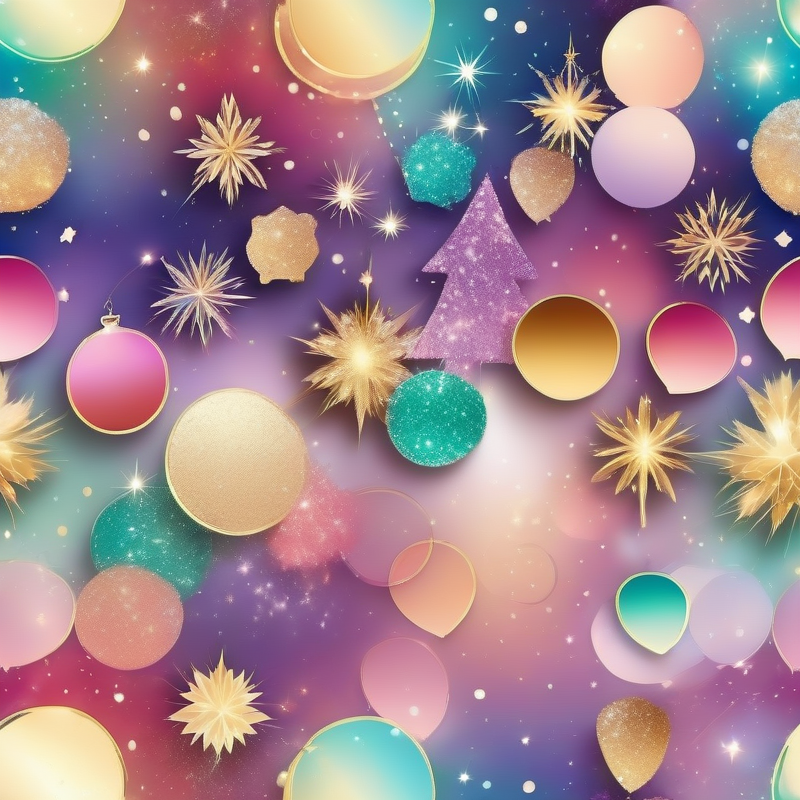


USING PROMPT: New Year symbols arranged neatly, pastel pink and green background, glossy highlights, subtle vignette, postcard, no text


  0%|          | 0/28 [00:00<?, ?it/s]

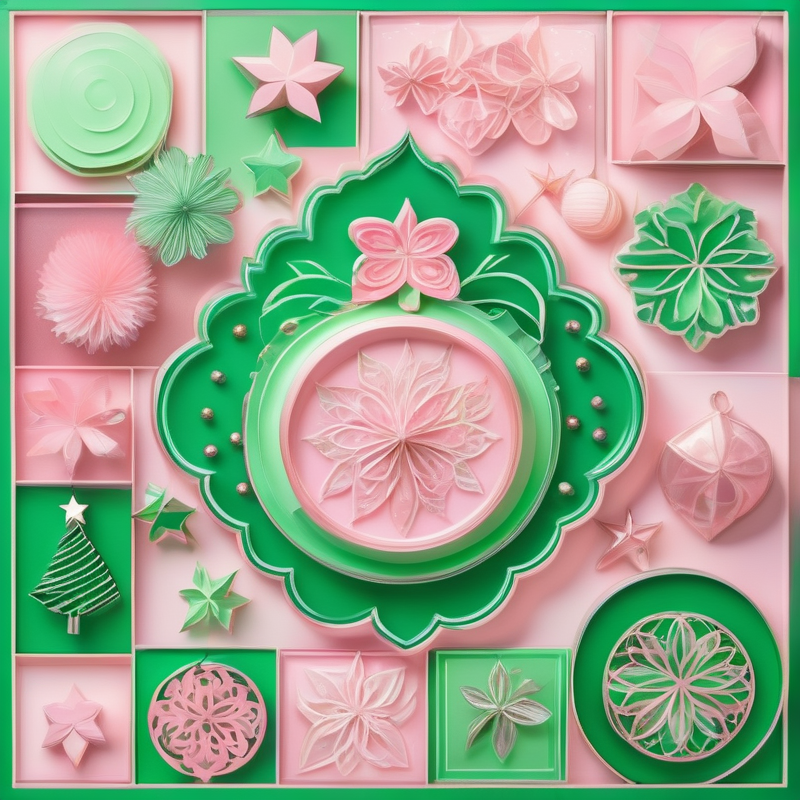


USING PROMPT: New Year main symbol inside a decorative heart or wreath frame, soft lighting, high saturation, clean background, postcard, no text


  0%|          | 0/28 [00:00<?, ?it/s]

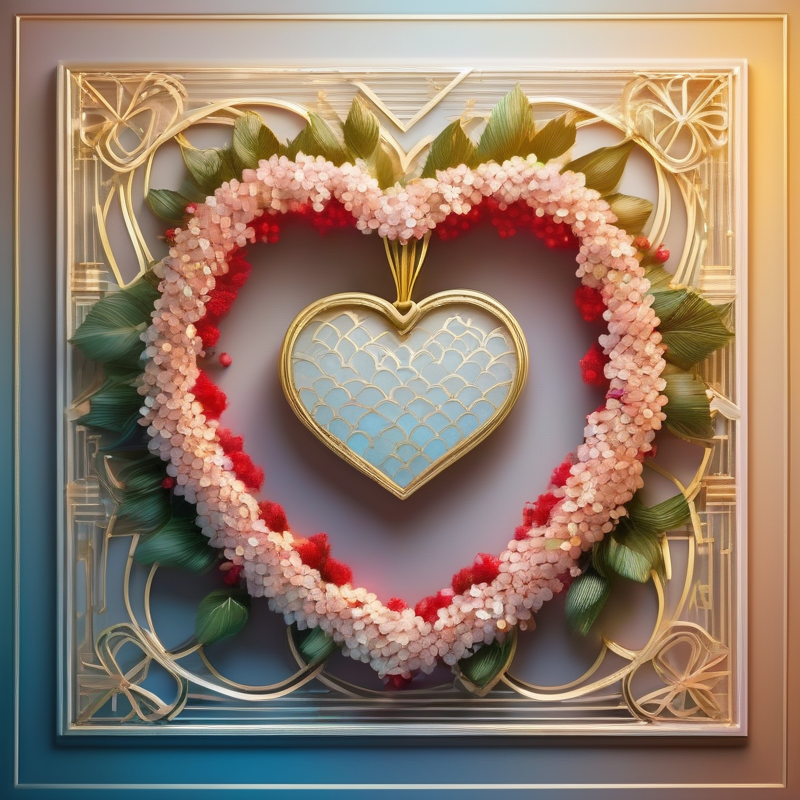

In [ ]:
from IPython.display import display

user_text = "Новый год"

pack = rewrite_for_sdxl(user_text)
print("EN topic:", pack["topic_en"])
for i, p in enumerate(pack["prompts"], 1):
    print(f"Prompt {i}: {p}")
print("NEG:", pack["negative"])

for i, p in enumerate(pack["prompts"], 1):
    print("\nUSING PROMPT:", p)
    img = gen(p, f"postcard_{i}.png", negative=pack["negative"], seed=48+i)
    display(img)


Using agent model Qwen/Qwen2.5-1.5B-Instruct

In [ ]:
# bad prompting and a lot of memory needed
!pip install -q transformers accelerate torch

import re, torch
from typing import List
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, AutoModelForCausalLM

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE  = torch.float16 if DEVICE == "cuda" else torch.float32

ruen_tok = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-ru-en")
ruen_mt  = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-ru-en").to(DEVICE).eval()

@torch.inference_mode()
def ru2en(text: str) -> str:
    enc = ruen_tok(text.strip(), return_tensors="pt").to(DEVICE)
    out = ruen_mt.generate(**enc, max_new_tokens=64)
    return ruen_tok.batch_decode(out, skip_special_tokens=True)[0].strip()

CYR = re.compile(r"[А-Яа-яЁё]")
def to_english(s: str) -> str:
    return ru2en(s) if CYR.search(s) else s.strip()

q_model_id = "Qwen/Qwen2.5-1.5B-Instruct"
q_tok = AutoTokenizer.from_pretrained(q_model_id)
q_llm = AutoModelForCausalLM.from_pretrained(q_model_id, torch_dtype=DTYPE).to(DEVICE).eval()

SYSTEM = (
    "You rewrite a short holiday/topic into three concise Stable Diffusion XL prompts for a festive POSTCARD.\n"
    "- Keep each line concrete and short (<= 55 words).\n"
    "- Focus on specific subjects and simple composition (who/where/foreground/background).\n"
    "- Allowed: pastel background, soft bokeh, glitter sparkles, glossy highlights, photomontage postcard style.\n"
    "- Must include: 'postcard, no text'.\n"
    "- FORBIDDEN: masterpiece, 8k, absurdres, by <artist>, nsfw, anatomy, camera brands.\n"
    "- Output exactly three lines, no numbering."
)
EXAMPLES = (
    "Examples:\n"
    "Valentine's Day -> picture of two kittens sitting inside a big pink heart, sparkles and roses, pastel background, no text\n"
    "Easter -> yellow chick emerging from decorated egg shell, surrounded by spring flowers, pastel pink and green background, glitter sparkles, glossy highlights, photomontage postcard style, no text\n"
    "Christmas -> white dove flying over red roses, glowing sunset, sparkles, high saturation, no text\n"
)

def _chat_ids(topic_en: str) -> torch.Tensor:
    messages = [
        {"role": "system", "content": SYSTEM + "\n" + EXAMPLES},
        {"role": "user",   "content": f"Topic: {topic_en}\nReturn 3 lines, one per prompt."}
    ]
    return q_tok.apply_chat_template(messages, add_generation_prompt=True, return_tensors="pt").to(DEVICE)

BLACK = [
    r"\bmasterpiece\b", r"\b8k\b", r"\babsurdres\b",
    r"\b(anatomy|nsfw)\b", r"\bby\s+[A-Z][a-z]+\b", r"\bdslr\b"
]
def _sanitize(line: str, max_words=55) -> str:
    t = line.strip()
    for patt in BLACK:
        t = re.sub(patt, "", t, flags=re.IGNORECASE)
    t = re.sub(r"^\s*\d+\s*[\.\)\-:]\s*", "", t)
    t = re.sub(r"\s*,\s*", ", ", t)
    t = re.sub(r"(,\s*){2,}", ", ", t).strip(" ,")
    low = t.lower()
    if "postcard" not in low: t += ", postcard"
    if "no text" not in low:  t += ", no text"
    words = t.split()
    if len(words) > max_words: t = " ".join(words[:max_words])
    return t

@torch.inference_mode()
def make_three_prompts(user_text: str, temperature=0.25) -> dict:
    topic_en = to_english(user_text)
    ids = _chat_ids(topic_en)
    out = q_llm.generate(
        ids, max_new_tokens=220, do_sample=True, temperature=temperature,
        top_p=0.8, repetition_penalty=1.05,
        eos_token_id=q_tok.eos_token_id, pad_token_id=q_tok.eos_token_id
    )
    raw = q_tok.decode(out[0][ids.shape[-1]:], skip_special_tokens=True)
    lines = [l for l in (s.strip() for s in raw.splitlines()) if l]
    lines = lines[:3] if len(lines) >= 3 else (lines + [""]*(3-len(lines)))
    clean = [_sanitize(l) if l else "festive postcard scene, pastel background, soft bokeh, glitter sparkles, postcard, no text"
             for l in lines]
    return {"topic_en": topic_en, "prompts": clean,
            "negative": "text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy"}


!pip install -q diffusers==0.31.0 safetensors
import torch
from diffusers import StableDiffusionXLPipeline
from IPython.display import display

device = "cuda" if torch.cuda.is_available() else "cpu"
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16 if device=="cuda" else torch.float32,
    use_safetensors=True, add_watermarker=False
).to(device)

pipe.load_lora_weights("AiWise/sdxl-faetastic-details_v24",
                       weight_name="SDXLFaeTastic2400.safetensors",
                       adapter_name="fae")
pipe.set_adapters({"fae": 0.55})

def gen(prompt: str, outfile: str, negative: str, steps=28, cfg=6.5, w=1024, h=1536, seed=1234):
    g = torch.Generator(device=device).manual_seed(seed)
    img = pipe(prompt=prompt, negative_prompt=negative,
               num_inference_steps=steps, guidance_scale=cfg,
               width=w, height=h, generator=g).images[0]
    img.save(outfile)
    return img

user_text = "8 марта"

pack = make_three_prompts(user_text)
print("EN topic:", pack["topic_en"])
for i, p in enumerate(pack["prompts"], 1):
    print(f"Prompt {i}: {p}")
print("NEG:", pack["negative"])

for i, p in enumerate(pack["prompts"], 1):
    img = gen(p, f"postcard_{i}.png", negative=pack["negative"], seed=1000+i)
    display(img)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

source.spm:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/803k [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


pytorch_model.bin:   0%|          | 0.00/307M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/307M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/242 [00:00<?, ?B/s]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 49.5 MB/s eta 0:00:00


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.safetens(…):   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


SDXLFaeTastic2400.safetensors:   0%|          | 0.00/456M [00:00<?, ?B/s]

The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


EN topic: 8 March
Prompt 1: A snowy village nestled under a starry sky, snowflakes gently falling, cozy cabin with a crackling fireplace, soft bokeh, glitter sparkles, glossy highlights, photomontage postcard style, no text.
Prompt 2: A vibrant flower garden bursting with colors, colorful tulips and daisies in full bloom, soft pastel background, soft bokeh, glitter sparkles, glossy highlights, photomontage postcard style, no text.
Prompt 3: A bustling market filled with fresh produce, colorful fruits and vegetables, people laughing and chatting, soft pastel background, soft bokeh, glitter sparkles, glossy highlights, photomontage postcard style, no text.
NEG: text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy


  0%|          | 0/28 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 1.50 GiB. GPU 0 has a total capacity of 14.74 GiB of which 952.12 MiB is free. Process 8958 has 13.81 GiB memory in use. Of the allocated memory 12.94 GiB is allocated by PyTorch, and 756.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

We've improved the Qwen's system prompt and examples.
Use Stable Diffusion и Lora.

This is the option we ultimately plan to use.

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

source.spm:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/803k [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


pytorch_model.bin:   0%|          | 0.00/307M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/307M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/242 [00:00<?, ?B/s]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 47.8 MB/s eta 0:00:00


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.safetens(…):   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


SDXLFaeTastic2400.safetensors:   0%|          | 0.00/456M [00:00<?, ?B/s]

EN topic: International Women's Day
Prompt 1: A group of women in vibrant colors gathered around a table, sharing stories and laughter, pastel gradient background, soft bokeh, postcard, no text.
Prompt 2: A colorful mosaic of women's portraits, each with a different job title, arranged in a circular pattern, pastel background, soft bokeh, glitter sparkles, glossy highlights, photomontage postcard style, no text.
Prompt 3: A photo of a woman holding a bouquet of flowers, surrounded  women in traditional attire, pastel pink and green background, soft bokeh, glitter sparkles, glossy highlights, photomontage postcard style, no text.
NEG: text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy


  0%|          | 0/24 [00:00<?, ?it/s]

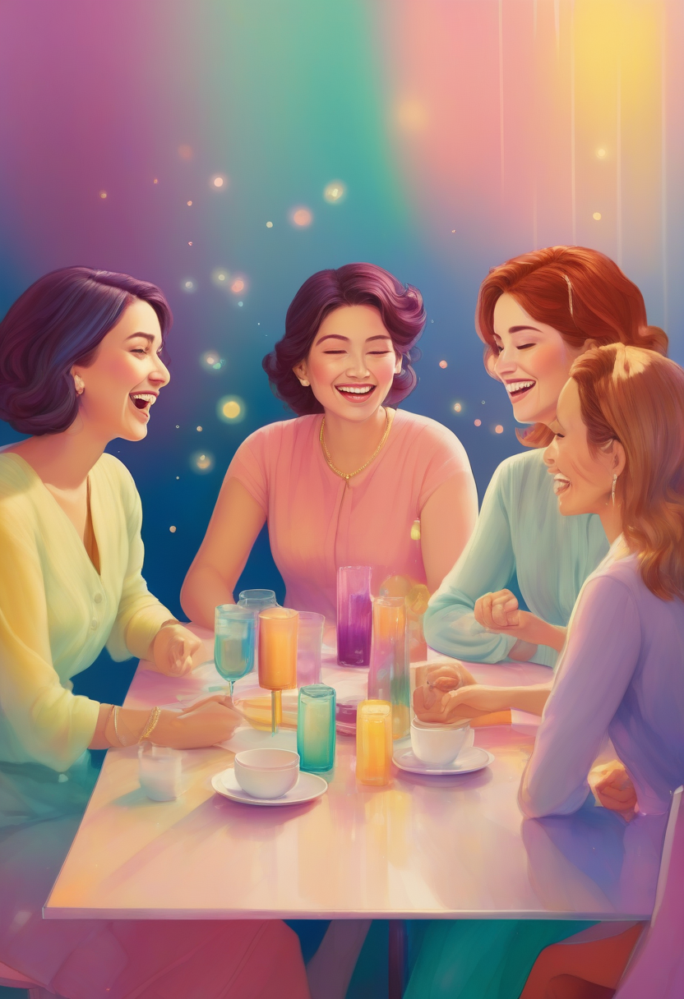

  0%|          | 0/24 [00:00<?, ?it/s]

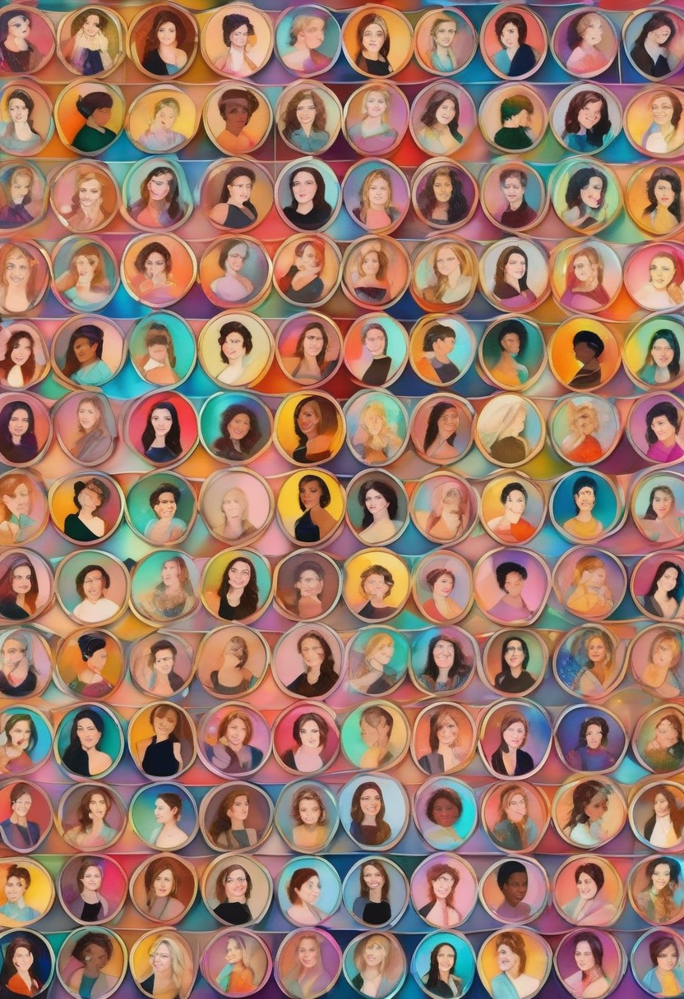

  0%|          | 0/24 [00:00<?, ?it/s]

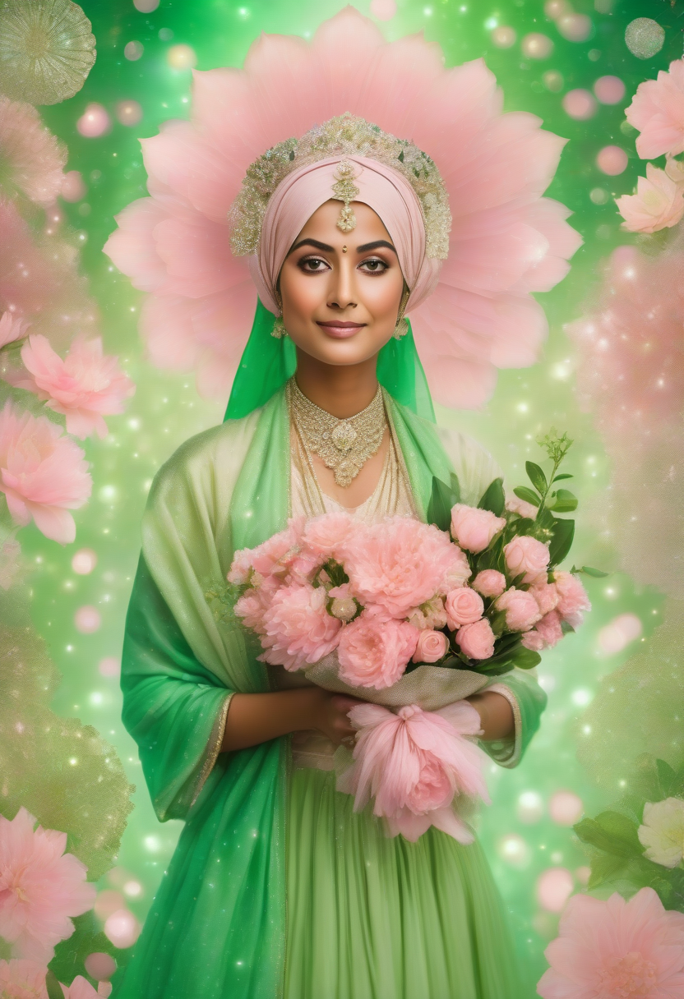

In [ ]:
# !pip install -q transformers accelerate torch

import re, torch
from typing import List
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, AutoModelForCausalLM

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE  = torch.float16 if DEVICE == "cuda" else torch.float32

ruen_tok = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-ru-en")
ruen_mt  = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-ru-en").to(DEVICE).eval()

@torch.inference_mode()
def ru2en(text: str) -> str:
    enc = ruen_tok(text.strip(), return_tensors="pt").to(DEVICE)
    out = ruen_mt.generate(**enc, max_new_tokens=64)
    return ruen_tok.batch_decode(out, skip_special_tokens=True)[0].strip()

CYR = re.compile(r"[А-Яа-яЁё]")
def to_english(s: str) -> str:
    return ru2en(s) if CYR.search(s) else s.strip()

q_model_id = "Qwen/Qwen2.5-1.5B-Instruct"
q_tok = AutoTokenizer.from_pretrained(q_model_id)
q_llm = AutoModelForCausalLM.from_pretrained(q_model_id, torch_dtype=DTYPE).to(DEVICE).eval()

SYSTEM = (
    "You rewrite a short holiday/topic into three concise Stable Diffusion XL prompts for a festive POSTCARD.\n"
    "- Keep each line concrete and short (<= 48 words).\n"
    "- Focus on specific subjects and simple composition (who/where/background).\n"
    "- Allowed: pastel background, soft bokeh, glitter sparkles, glossy highlights, photomontage postcard style.\n"
    "- Must include: 'postcard, no text'.\n"
    "- FORBIDDEN: masterpiece, 8k, absurdres, by <artist>, nsfw, anatomy, camera brands.\n"
    "- Avoid winter/snow/Christmas motifs unless the topic explicitly mentions them.\n"
    "- Output exactly three lines, no numbering."
)

EXAMPLES = (
    "Examples:\n"
    "Valentine's Day -> picture of two kittens sitting inside a big pink heart, sparkles and roses, pastel background, no text\n"
    "International Women's Day -> pink roses and satin ribbon arranged neatly, pastel gradient background, soft bokeh, postcard, no text\n"
    "Easter -> yellow chick emerging from decorated egg shell, surrounded by spring flowers, pastel pink and green background, glitter sparkles, glossy highlights, photomontage postcard style, no text\n"
    "Christmas -> white dove flying over red roses, glowing sunset, sparkles, high saturation, no text\n"
)

def normalize_topic(en_text: str) -> str:
    t = en_text.strip().lower()
    if t in {"8 march", "march 8", "8th march"}:
        return "International Women's Day"
    return en_text.strip()

def build_chat_inputs(topic_en: str):
    messages = [
        {"role": "system", "content": SYSTEM + "\n" + EXAMPLES},
        {"role": "user",   "content": f"Topic: {topic_en}\nReturn 3 lines, one per prompt."}
    ]

    prompt_text = q_tok.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    enc = q_tok(prompt_text, return_tensors="pt", padding=True).to(DEVICE)
    return enc

BLACK = [
    r"\bmasterpiece\b", r"\b8k\b", r"\babsurdres\b",
    r"\b(anatomy|nsfw)\b", r"\bby\s+[A-Z][a-z]+\b", r"\bdslr\b"
]

def sanitize_line(line: str, max_words=48) -> str:
    t = line.strip()
    t = re.sub(r"^\s*\d+\s*[\.\)\-:]\s*", "", t)
    for patt in BLACK:
        t = re.sub(patt, "", t, flags=re.IGNORECASE)
    t = re.sub(r"\s*,\s*", ", ", t)
    t = re.sub(r"(,\s*){2,}", ", ", t).strip(" ,")
    low = t.lower()
    if "postcard" not in low: t += ", postcard"
    if "no text" not in low:  t += ", no text"
    words = t.split()
    if len(words) > max_words: t = " ".join(words[:max_words])
    return t

@torch.inference_mode()
def make_three_prompts(user_text: str, temperature=0.2) -> dict:
    topic_en = normalize_topic(to_english(user_text))
    enc = build_chat_inputs(topic_en)
    out = q_llm.generate(
        **enc, max_new_tokens=200, do_sample=True, temperature=temperature,
        top_p=0.8, repetition_penalty=1.05,
        eos_token_id=q_tok.eos_token_id, pad_token_id=q_tok.eos_token_id
    )
    raw = q_tok.decode(out[0, enc["input_ids"].shape[-1]:], skip_special_tokens=True)
    lines = [s.strip() for s in raw.splitlines() if s.strip()]
    lines = lines[:3] if len(lines) >= 3 else (lines + [""]*(3-len(lines)))
    clean = [sanitize_line(l) if l else
             "festive postcard scene with fitting symbols, pastel background, soft bokeh, glitter sparkles, postcard, no text"
             for l in lines]
    neg = "text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy"
    return {"topic_en": topic_en, "prompts": clean, "negative": neg}

!pip install -q diffusers==0.31.0 safetensors accelerate
import torch
from diffusers import StableDiffusionXLPipeline

device = "cuda" if torch.cuda.is_available() else "cpu"
dtype  = torch.float16 if device == "cuda" else torch.float32

pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=dtype, use_safetensors=True, add_watermarker=False
).to(device)


pipe.enable_attention_slicing()
pipe.enable_vae_slicing()
pipe.enable_vae_tiling()

# LoRA
pipe.load_lora_weights(
    "AiWise/sdxl-faetastic-details_v24",
    weight_name="SDXLFaeTastic2400.safetensors",
    adapter_name="fae"
)
pipe.set_adapters({"fae": 0.55})

def gen(prompt: str, outfile: str, negative: str,
        steps=24, cfg=6.2, w=832, h=1216, seed=1234):
    g = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt, negative_prompt=negative,
        num_inference_steps=steps, guidance_scale=cfg,
        width=w, height=h, generator=g
    ).images[0]
    image.save(outfile)
    return image



from IPython.display import display
import torch

user_text = "8 марта"

pack = make_three_prompts(user_text)
print("EN topic:", pack["topic_en"])
for i, p in enumerate(pack["prompts"], 1):
    print(f"Prompt {i}: {p}")
print("NEG:", pack["negative"])

imgs = []
for i, p in enumerate(pack["prompts"], 1):
    img = gen(p, f"postcard_{i}.png", negative=pack["negative"], seed=1000+i)
    imgs.append(img); display(img)




In [1]:
!pip uninstall -y transformers tokenizers
!pip install -q --no-deps "transformers==4.46.3" "tokenizers==0.20.3" \
  "diffusers==0.31.0" "accelerate>=0.33" safetensors



Found existing installation: transformers 4.57.1
Uninstalling transformers-4.57.1:
  Successfully uninstalled transformers-4.57.1
Found existing installation: tokenizers 0.22.1
Uninstalling tokenizers-0.22.1:
  Successfully uninstalled tokenizers-0.22.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 31.2 MB/s eta 0:00:00


Tried to change stable diffusion by RealVisXL_V4.0

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

source.spm:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/803k [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


pytorch_model.bin:   0%|          | 0.00/307M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/242 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/577 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/474 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/602 [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

EN topic: International Women's Day
Prompt 1: Photo of a vibrant rainbow flag fluttering in front of a modern building, soft studio lighting, shallow depth of field, pastel background, gentle glitter, glossy highlights, postcard, no text
Prompt 2: photo of fitting holiday symbols, pastel background, soft bokeh, postcard, no text
Prompt 3: photo of fitting holiday symbols, pastel background, soft bokeh, postcard, no text
NEG: text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy, illustration, painting, 3d render, cartoon, anime


  0%|          | 0/24 [00:00<?, ?it/s]

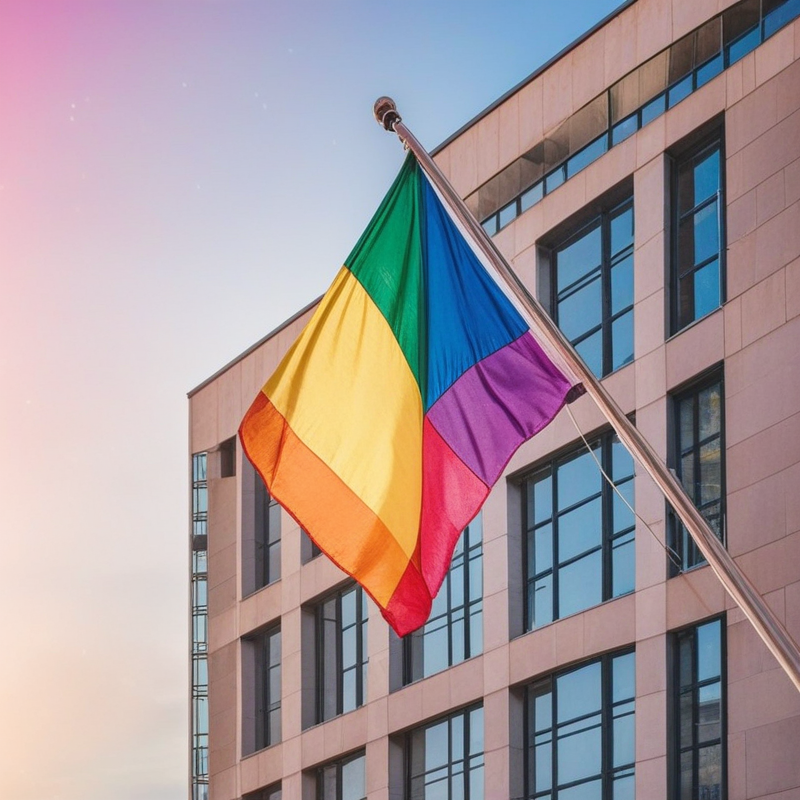

  0%|          | 0/24 [00:00<?, ?it/s]

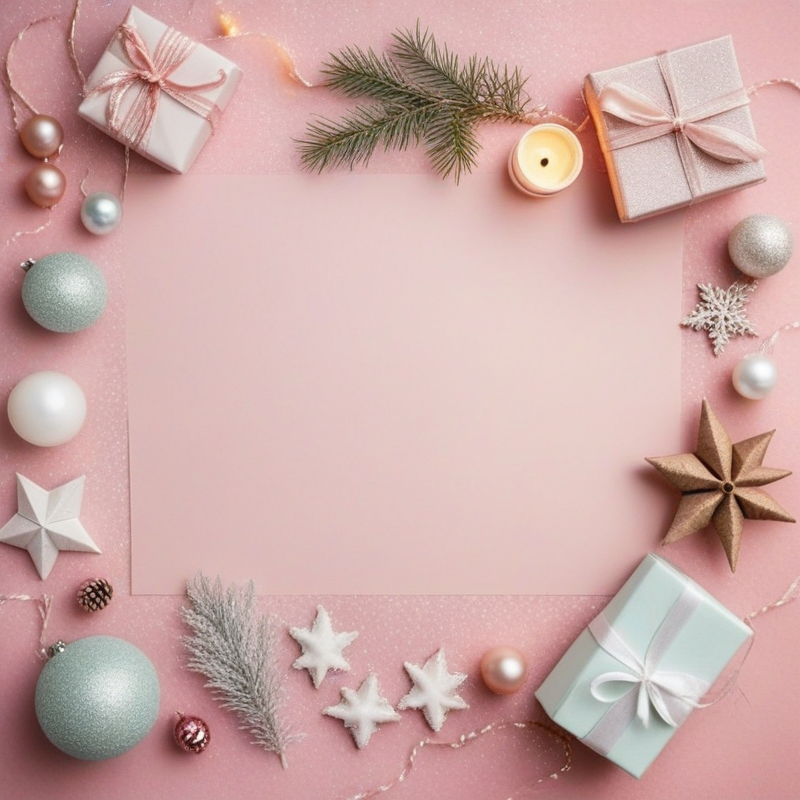

  0%|          | 0/24 [00:00<?, ?it/s]

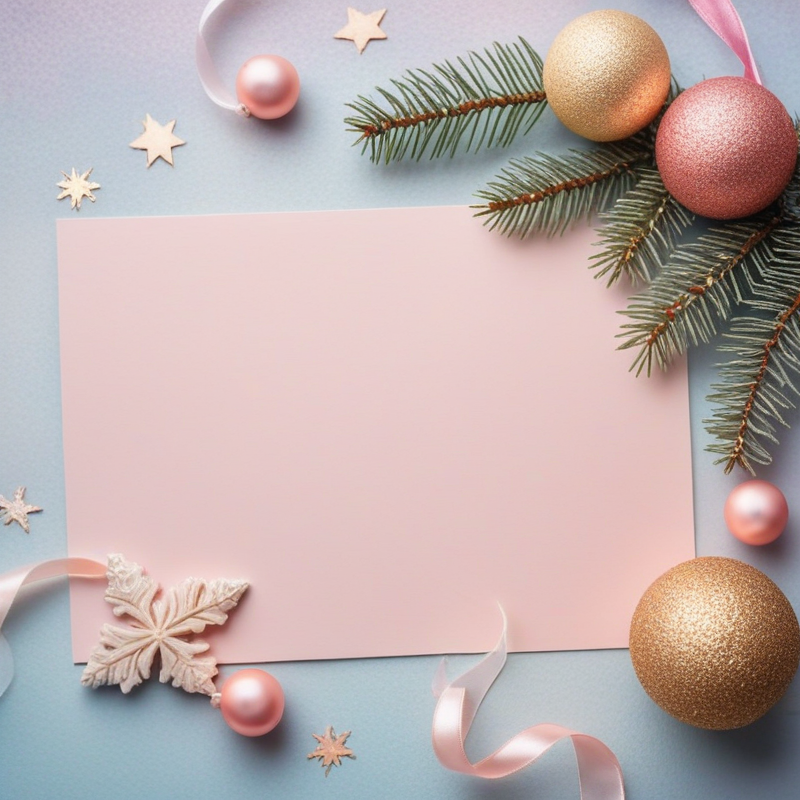

In [ ]:
# !pip install -q transformers accelerate diffusers==0.31.0 safetensors torch --upgrade

import re, torch
from typing import List
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, AutoModelForCausalLM

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE  = torch.float16 if DEVICE == "cuda" else torch.float32

ruen_tok = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-ru-en")
ruen_mt  = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-ru-en").to(DEVICE).eval()

@torch.inference_mode()
def ru2en(text: str) -> str:
    enc = ruen_tok(text.strip(), return_tensors="pt").to(DEVICE)
    out = ruen_mt.generate(**enc, max_new_tokens=64)
    return ruen_tok.batch_decode(out, skip_special_tokens=True)[0].strip()

CYR = re.compile(r"[А-Яа-яЁё]")
def to_english(s: str) -> str:
    return ru2en(s) if CYR.search(s) else s.strip()

q_model_id = "Qwen/Qwen2.5-1.5B-Instruct"
q_tok = AutoTokenizer.from_pretrained(q_model_id)
q_llm = AutoModelForCausalLM.from_pretrained(q_model_id, torch_dtype=DTYPE).to(DEVICE).eval()

SYSTEM = (
    "You rewrite a short holiday/topic into three concise SDXL prompts for a FESTIVE POSTCARD PHOTO.\n"
    "- Keep each line concrete and <= 40-48 words.\n"
    "- Use photographic wording: photo, soft studio lighting, shallow depth of field, natural colors.\n"
    "- Composition: clear subject + simple background (who/where/bg).\n"
    "- Allowed vibes: pastel background, soft bokeh, gentle glitter (optional), glossy highlights.\n"
    "- Must end with: 'postcard, no text'.\n"
    "- FORBIDDEN: illustration, painting, digital art, 3d render, cartoon, anime, masterpiece, 8k, absurdres, by <artist>, nsfw, anatomy, camera brands.\n"
    "- Avoid winter/snow unless the topic says so.\n"
    "- Output exactly three lines, no numbering."
)

EXAMPLES = (
    "Examples:\n"
    "Valentine's Day -> photo of two kittens sitting inside a big pink heart, roses around, pastel background, soft bokeh, postcard, no text\n"
    "International Women's Day -> photo of pink roses and satin ribbon arranged neatly, pastel gradient background, soft bokeh, postcard, no text\n"
    "Easter -> photo of a yellow chick emerging from a decorated egg shell, spring flowers, pastel pink and green background, glossy highlights, postcard, no text\n"
)

def normalize_topic(en_text: str) -> str:
    t = en_text.strip().lower()
    if t in {"8 march", "march 8", "8th march"}:
        return "International Women's Day"
    return en_text.strip()

def build_chat_inputs(topic_en: str):
    messages = [
        {"role": "system", "content": SYSTEM + "\n" + EXAMPLES},
        {"role": "user",   "content": f"Topic: {topic_en}\nReturn 3 lines, one per prompt."}
    ]
    txt = q_tok.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    return q_tok(txt, return_tensors="pt", padding=True).to(DEVICE)

BLACK = [
    r"\bmasterpiece\b", r"\b8k\b", r"\babsurdres\b",
    r"\b(anatomy|nsfw)\b", r"\bby\s+[A-Z][a-z]+\b",
    r"\billustration\b", r"\bpainting\b", r"\b3d\s*render\b", r"\bcartoon\b", r"\banime\b"
]

def sanitize_line(line: str, max_words=48) -> str:
    t = line.strip()
    t = re.sub(r"^\s*\d+\s*[\.\)\-:]\s*", "", t)
    for patt in BLACK:
        t = re.sub(patt, "", t, flags=re.IGNORECASE)
    t = re.sub(r"\s*,\s*", ", ", t)
    t = re.sub(r"(,\s*){2,}", ", ", t).strip(" ,")
    if "postcard" not in t.lower(): t += ", postcard"
    if "no text"  not in t.lower(): t += ", no text"
    words = t.split()
    if len(words) > max_words: t = " ".join(words[:max_words])
    return t

@torch.inference_mode()
def make_three_prompts(user_text: str, temperature=0.2) -> dict:
    topic_en = normalize_topic(to_english(user_text))
    enc = build_chat_inputs(topic_en)
    out = q_llm.generate(
        **enc, max_new_tokens=180, do_sample=True, temperature=temperature,
        top_p=0.8, repetition_penalty=1.05,
        eos_token_id=q_tok.eos_token_id, pad_token_id=q_tok.eos_token_id
    )
    raw = q_tok.decode(out[0, enc["input_ids"].shape[-1]:], skip_special_tokens=True)
    lines = [s.strip() for s in raw.splitlines() if s.strip()]
    lines = lines[:3] if len(lines) >= 3 else (lines + [""]*(3-len(lines)))
    clean = [sanitize_line(l) if l else
             "photo of fitting holiday symbols, pastel background, soft bokeh, postcard, no text"
             for l in lines]
    neg = "text, letters, watermark, logo, low quality, blurry, jpeg artifacts, duplicates, extra limbs, extra heads, bad anatomy, illustration, painting, 3d render, cartoon, anime"
    return {"topic_en": topic_en, "prompts": clean, "negative": neg}

from diffusers import StableDiffusionXLPipeline, DPMSolverMultistepScheduler

model_id = "SG161222/RealVisXL_V4.0"
pipe = StableDiffusionXLPipeline.from_pretrained(
    model_id, torch_dtype=DTYPE, use_safetensors=True, add_watermarker=False
).to(DEVICE)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config, use_karras=True)
pipe.enable_attention_slicing()
pipe.enable_vae_slicing()
pipe.enable_vae_tiling()

USE_FAE = False
if USE_FAE:
    pipe.load_lora_weights("AiWise/sdxl-faetastic-details_v24",
                           weight_name="SDXLFaeTastic2400.safetensors",
                           adapter_name="fae")
    pipe.set_adapters({"fae": 0.15})

def gen(prompt: str, outfile: str, negative: str,
        steps=24, cfg=4.5, w=800, h=800, seed=1234):
    g = torch.Generator(device=DEVICE).manual_seed(seed)
    image = pipe(
        prompt=prompt, negative_prompt=negative,
        num_inference_steps=steps, guidance_scale=cfg,
        width=w, height=h, generator=g
    ).images[0]
    image.save(outfile)
    return image

from IPython.display import display

user_text = "8 марта"

pack = make_three_prompts(user_text)
print("EN topic:", pack["topic_en"])
for i, p in enumerate(pack["prompts"], 1):
    print(f"Prompt {i}: {p}")
print("NEG:", pack["negative"])

imgs = []
for i, p in enumerate(pack["prompts"], 1):
    img = gen(p, f"postcard_{i}.png", negative=pack["negative"], seed=1000+i)
    imgs.append(img); display(img)
